# HD-MEA event GIFs: hex-binned IFR + band-passed LFP phase

Self-contained (no `ephax` import) code to reproduce the two event GIF types:

1. **Hex-binned instantaneous firing rate (IFR)** — spikes only, no LFP.
2. **Band-passed LFP phase field** — Hilbert phase of a band-passed, downsampled LFP chunk.

Both GIFs are rendered from the **same event window** (same anchor time, same pre/post bounds,
same frame timestamps) so they can be watched side by side.

**This notebook does not do burst/event detection.** Bring your own anchor time(s) — anything
that marks a moment of interest (e.g. a population-rate peak) works; plug it into
`ANCHOR_TIMES_S` near the bottom. The demo there uses a trivial population-rate-peak picker
just so the notebook is runnable out of the box.

Reads raw MaxTwo HDF5 recordings (`data.raw.h5`, spikes + electrode mapping under
`data_store/dataNNNN`) directly via `h5py` — same file format used across this lab's recordings.

Dependencies: `numpy`, `scipy`, `h5py`, `matplotlib`, `imageio` (`pip install numpy scipy h5py matplotlib imageio`).

## Imports

In [64]:
%matplotlib inline
from io import BytesIO
from pathlib import Path

import h5py
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Image, display
from matplotlib.colors import LogNorm
from scipy.ndimage import gaussian_filter1d
from scipy.signal import butter, hilbert, sosfiltfilt
from scipy.signal import resample_poly

## Configuration

Everything you're likely to change lives here. `RAW_FILE` and `WELL` point at the recording;
the rest control the GIF windowing and appearance.

In [65]:
# --- recording ---
RAW_FILE = Path("/Users/danielrebbin/Documents/Academia/UvA/Internship/Wes_Files/Data/LFP/stimRemovalNull") / "DIV 12" / "data.raw.h5"
WELL = 0                      # MaxTwo well index -> dataset alias data0000, data0001, ...
MIN_AMP = 0.0                 # drop spikes with |amplitude| below this (0 = keep all)

# --- shared event window (both GIFs use this) ---
PRE_MS = 25.0                 # window start, relative to the anchor
POST_MS = 40.0                # window stop, relative to the anchor
FRAME_STEP_MS = 1.0           # time between GIF frames
FILTER_CONTEXT_PAD_S = 0.25   # extra raw context loaded so sosfiltfilt/Hilbert edges fall outside the display window

# --- LFP band-pass ---
BAND_LOW_HZ = 30.0
BAND_HIGH_HZ = 40.0           # 30-50 Hz gamma by default; set both to None to skip band-pass and use raw LFP phase
FS_DS = 500.0                 # downsampled sample rate for the phase GIF (Hz)

# --- IFR (spikes-only GIF) ---
IFR_BIN_MS = 1.0              # spike-binning resolution
IFR_SMOOTH_SIGMA_MS = 3.0     # Gaussian smoothing sigma applied to the binned rate

# --- GIF appearance ---
HEX_GRIDSIZE = 35
HEX_CMAP = "magma"
PHASE_CMAP = "twilight"
GIF_DURATION_S = 0.12         # seconds per frame on playback
GIF_DPI = 130

OUTPUT_DIR = Path("GIFs") / "for_caitlin"   # matches this repo's GIFs/**/*.gif gitignore convention
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

## Raw data I/O (MaxTwo HDF5)

Minimal readers for the raw voltage array, electrode mapping, and spike table. If your data
comes from somewhere else, you only need to supply the same shapes these return:
`spike_times_s`, `spike_electrodes` (1-D arrays), `raw` (`time x channel`, volts),
`coords_um` (`channel x 2`), `electrodes` (`channel`,), `fs_raw` (Hz) — everything below this
section works from those arrays alone.

In [66]:
def _dataset_group(h5, well):
    """Resolve the recording group + raw-voltage dataset path for a MaxTwo well index."""
    rec_group_path = f"/data_store/data{int(well):04d}"
    rec_group = h5[rec_group_path]
    groups = rec_group["groups"]
    for name in ("all_channels", "routed"):
        candidate = f"{rec_group_path}/groups/{name}/raw"
        if candidate in h5:
            return rec_group, candidate
    for name, group in groups.items():
        if isinstance(group, h5py.Group) and "raw" in group:
            return rec_group, f"{rec_group_path}/groups/{name}/raw"
    raise KeyError(f"No raw dataset found under {rec_group_path}/groups")


def _read_mapping(settings):
    mapping = settings["mapping"]
    arr = mapping[:] if isinstance(mapping, h5py.Dataset) else mapping
    if getattr(arr, "dtype", None) is not None and arr.dtype.fields is not None:
        return {name: np.asarray(arr[name]) for name in ("channel", "electrode", "x", "y")}
    return {name: np.asarray(mapping[name])[:] for name in ("channel", "electrode", "x", "y")}


def inspect_recording(raw_file, well):
    """Return fs_raw (Hz), recording duration (s), and n_raw_frames for a well."""
    with h5py.File(raw_file, "r") as h5:
        rec_group, raw_path = _dataset_group(h5, well)
        fs_raw = float(rec_group["settings"]["sampling"][0])
        n_frames = int(h5[raw_path].shape[1])
    return {"fs_raw": fs_raw, "n_frames": n_frames, "duration_s": n_frames / fs_raw}


def load_raw_chunk(raw_file, well, start_frame, n_frames):
    """Read a bounded raw-voltage chunk as (time, channel) in volts, plus mapping.

    Returns: raw[n_samples, n_channel] (float32, volts), coords_um[n_channel, 2],
    electrodes[n_channel] (int), fs_raw (Hz).
    """
    start_frame = max(0, int(start_frame))
    n_frames = max(0, int(n_frames))
    with h5py.File(raw_file, "r") as h5:
        rec_group, raw_path = _dataset_group(h5, well)
        raw = h5[raw_path]
        settings = rec_group["settings"]
        fs_raw = float(settings["sampling"][0])
        lsb = float(settings["lsb"][0])
        mapping = _read_mapping(settings)

        total_frames = int(raw.shape[1])
        stop_frame = min(total_frames, start_frame + n_frames)
        if stop_frame <= start_frame:
            raise ValueError("Requested chunk is empty or out of range.")

        mapped_channels = np.asarray(mapping["channel"], dtype=np.int64)
        raw_group = raw.parent
        if "channels" in raw_group and int(raw_group["channels"].shape[0]) == int(raw.shape[0]):
            raw_channels = np.asarray(raw_group["channels"][:], dtype=np.int64)
            channel_to_row = {int(c): row for row, c in enumerate(raw_channels)}
            row_indices = np.asarray([channel_to_row.get(int(c), -1) for c in mapped_channels], dtype=np.int64)
        else:
            row_indices = mapped_channels.copy()

        keep = (
            (row_indices >= 0) & (row_indices < int(raw.shape[0]))
            & np.isfinite(mapping["x"]) & np.isfinite(mapping["y"])
        )
        mapped_channels = mapped_channels[keep]
        row_indices = row_indices[keep]
        order = np.argsort(mapped_channels)  # stable channel ordering, independent of on-disk row order
        read_rows = row_indices[order]

        h5_order = np.argsort(read_rows)
        inverse_h5_order = np.argsort(h5_order)
        raw_block = raw[read_rows[h5_order], start_frame:stop_frame][inverse_h5_order]
        data = np.asarray(raw_block, dtype=np.float32).T * np.float32(lsb)

        coords_um = np.column_stack((np.asarray(mapping["x"])[keep], np.asarray(mapping["y"])[keep]))[order]
        electrodes = np.asarray(mapping["electrode"])[keep][order].astype(int)
    return data, coords_um.astype(float), electrodes, fs_raw


def load_spikes(raw_file, well, *, min_amp=0.0):
    """Return spike_times_s, spike_electrodes (both 1-D arrays) for a well."""
    with h5py.File(raw_file, "r") as h5:
        rec_group, raw_path = _dataset_group(h5, well)
        settings = rec_group["settings"]
        mapping = _read_mapping(settings)
        sf = float(settings["sampling"][0])
        spikes_arr = rec_group["spikes"][:]
        frame_nos = h5[raw_path].parent.get("frame_nos")
        first_frame = (
            int(frame_nos[0]) if frame_nos is not None and frame_nos.shape[0]
            else int(np.nanmin(spikes_arr["frameno"])) if spikes_arr.size else 0
        )
        time_s = (np.asarray(spikes_arr["frameno"], dtype=float) - first_frame) / sf
        channel = np.asarray(spikes_arr["channel"])
        amplitude = np.asarray(spikes_arr["amplitude"])
    channel_to_electrode = {int(c): int(e) for c, e in zip(mapping["channel"], mapping["electrode"])}
    electrode = np.asarray([channel_to_electrode.get(int(c), -1) for c in channel])
    keep = (electrode >= 0) & (time_s >= 0) & (np.abs(amplitude) >= float(min_amp))
    return time_s[keep], electrode[keep]

## Per-electrode instantaneous firing rate (spikes only)

Bins spikes into fixed-width time bins per electrode, converts counts to a rate (Hz), and
Gaussian-smooths across time. Also returns a `spike_presence` mask (did *any* spike land in this
bin?), used to outline actively-spiking electrodes in the hex-binned GIF.

In [67]:
def compute_electrode_ifr(spike_times_s, spike_electrodes, electrodes, t0, t1, *,
                           bin_ms=1.0, smooth_sigma_ms=3.0):
    """Windowed, Gaussian-smoothed per-electrode firing rate.

    Returns: time_centers_s[n_bins], rate_hz[n_electrode, n_bins], spike_presence[n_electrode, n_bins] (bool).
    """
    dt = float(bin_ms) / 1000.0
    bin_edges = np.arange(float(t0), float(t1) + dt, dt)
    time_centers = bin_edges[:-1] + 0.5 * dt
    electrodes = np.asarray(electrodes, dtype=int)
    n_electrodes, n_bins = electrodes.size, time_centers.size

    counts = np.zeros((n_electrodes, n_bins), dtype=np.int32)
    in_window = (spike_times_s >= t0) & (spike_times_s < t1)
    if np.any(in_window) and n_electrodes and n_bins:
        times = spike_times_s[in_window]
        elecs = spike_electrodes[in_window]
        order = np.argsort(electrodes, kind="mergesort")
        sorted_electrodes = electrodes[order]
        positions = np.searchsorted(sorted_electrodes, elecs)
        valid = positions < sorted_electrodes.size
        matched = np.zeros(elecs.shape, dtype=bool)
        matched[valid] = sorted_electrodes[positions[valid]] == elecs[valid]
        if np.any(matched):
            row_idx = order[positions[matched]]
            bin_idx = np.clip(np.searchsorted(bin_edges, times[matched], side="right") - 1, 0, n_bins - 1)
            np.add.at(counts, (row_idx, bin_idx), 1)

    spike_presence = counts > 0
    rate_hz = counts.astype(np.float32) / np.float32(dt)
    sigma_bins = float(smooth_sigma_ms) / float(bin_ms)
    rate_hz = gaussian_filter1d(rate_hz, sigma=sigma_bins, axis=1, mode="nearest")
    return time_centers, rate_hz, spike_presence

## GIF 1: hex-binned IFR (spikes only)

Colors each hex bin by mean electrode IFR (log scale); electrodes that spiked in the current
frame get a white outline.

In [68]:
def save_ifr_hexbin_gif(out_path, rate_hz, spike_presence, time_centers_s, x_um, y_um, *,
                         anchor_time_s=None, frame_step_n=1, gridsize=HEX_GRIDSIZE, cmap=HEX_CMAP,
                         duration_s=GIF_DURATION_S, dpi=GIF_DPI, title_prefix="Hex-binned IFR"):
    """Render a hex-binned electrode-IFR GIF. rate_hz/spike_presence: [n_electrode, n_bins]."""
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)

    positive = rate_hz[rate_hz > 0]
    vmin = max(1e-2, float(np.quantile(positive, 0.05))) if positive.size else 1e-2
    vmax = max(vmin * 10.0, float(np.quantile(positive, 0.995))) if positive.size else vmin * 10.0
    xlim = (float(np.min(x_um)) - 50.0, float(np.max(x_um)) + 50.0)
    ylim = (float(np.min(y_um)) - 50.0, float(np.max(y_um)) + 50.0)
    extent = (*xlim, *ylim)
    box_aspect = (ylim[1] - ylim[0]) / max(xlim[1] - xlim[0], 1e-9)
    frame_indices = np.arange(0, time_centers_s.size, max(1, int(frame_step_n)), dtype=int)

    with imageio.get_writer(out_path, mode="I", duration=float(duration_s)) as writer:
        for t_idx in frame_indices:
            fig, ax = plt.subplots(figsize=(6.2, 6.2 * box_aspect + 0.6))
            hb = ax.hexbin(x_um, y_um, C=np.clip(rate_hz[:, t_idx], vmin, vmax), reduce_C_function=np.mean,
                           gridsize=gridsize, cmap=cmap, mincnt=1, linewidths=0.35, edgecolors="black",
                           norm=LogNorm(vmin=vmin, vmax=vmax), extent=extent)
            spiking = spike_presence[:, t_idx]
            if np.any(spiking):
                outline = ax.hexbin(x_um[spiking], y_um[spiking], gridsize=gridsize, mincnt=1,
                                     linewidths=0.6, edgecolors="white", extent=extent)
                outline.set_facecolor("none")
            ax.set_facecolor("black")
            ax.set_xlim(*xlim); ax.set_ylim(*ylim)
            ax.set_aspect("equal", adjustable="box")
            ax.set_xlabel("x (um)"); ax.set_ylabel("y (um)")
            frame_time = float(time_centers_s[t_idx])
            if anchor_time_s is None:
                ax.set_title(f"{title_prefix} | t = {frame_time:.3f} s")
            else:
                ax.set_title(f"{title_prefix} | t = {(frame_time - anchor_time_s) * 1000:+.0f} ms")
            cbar = fig.colorbar(hb, ax=ax)
            cbar.set_label("Electrode IFR (Hz, log scale)")
            fig.tight_layout()
            buf = BytesIO()
            fig.savefig(buf, format="png", dpi=dpi)
            buf.seek(0)
            writer.append_data(imageio.imread(buf))
            buf.close()
            plt.close(fig)
    return out_path

## GIF 2: band-passed LFP phase field

Demeans, SOS band-passes, and downsamples the raw LFP chunk, takes the Hilbert transform to get
per-channel phase, then colors each electrode by phase (twilight colormap). Set `BAND_LOW_HZ`/
`BAND_HIGH_HZ` to `None` above to skip band-passing and take the phase of the raw (down-sampled)
trace instead.

In [69]:
def bandpass_downsample(data, fs_raw, band_low, band_high, fs_ds, *, order=4):
    """Demean, SOS band-pass (zero-phase), and downsample. data: [time, channel]."""
    data = np.asarray(data, dtype=np.float32)
    data = data - np.nanmean(data, axis=0, keepdims=True)
    data = np.nan_to_num(data)
    if band_low is not None and band_high is not None:
        sos = butter(order, [band_low, band_high], btype="bandpass", fs=fs_raw, output="sos")
        data = sosfiltfilt(sos, data, axis=0).astype(np.float32)
    from fractions import Fraction
    ratio = Fraction(float(fs_ds) / float(fs_raw)).limit_denominator(1000)
    return resample_poly(data, ratio.numerator, ratio.denominator, axis=0).astype(np.float32)


def hilbert_phase(data_ds):
    """Per-channel Hilbert phase (radians) and amplitude. data_ds: [time, channel]."""
    z = hilbert(np.asarray(data_ds), axis=0)
    return np.angle(z), np.abs(z)


def save_phase_scatter_gif(out_path, phase, time_s, coords_um, electrodes, *,
                            anchor_time_s=None, frame_step_n=1, spike_times_s=None, spike_electrodes=None,
                            amplitude_alpha=None, dot_size=14.0, cmap=PHASE_CMAP, duration_s=GIF_DURATION_S,
                            dpi=GIF_DPI, title_prefix="LFP phase"):
    """Render an LFP phase-field GIF. phase/time_s: [n_times, n_channel] / [n_times]."""
    out_path = Path(out_path)
    out_path.parent.mkdir(parents=True, exist_ok=True)
    x_um, y_um = coords_um[:, 0], coords_um[:, 1]
    xlim = (float(np.min(x_um)) - 60.0, float(np.max(x_um)) + 60.0)
    ylim = (float(np.min(y_um)) - 60.0, float(np.max(y_um)) + 60.0)

    alpha = np.ones(phase.shape[1]) if amplitude_alpha is None else np.clip(np.nan_to_num(amplitude_alpha, nan=0.2), 0.2, 1.0)
    electrode_to_idx = {int(e): i for i, e in enumerate(electrodes)}
    spike_times_s = np.asarray([] if spike_times_s is None else spike_times_s, dtype=float)
    spike_electrodes = np.asarray([] if spike_electrodes is None else spike_electrodes, dtype=int)
    half_window_s = 0.5 * float(np.median(np.diff(time_s))) if time_s.size > 1 else 0.001

    norm = plt.Normalize(vmin=-np.pi, vmax=np.pi)
    cmap_obj = plt.get_cmap(cmap)
    mappable = plt.cm.ScalarMappable(norm=norm, cmap=cmap_obj)
    mappable.set_array([])
    frame_indices = np.arange(0, time_s.size, max(1, int(frame_step_n)), dtype=int)

    with imageio.get_writer(out_path, mode="I", duration=float(duration_s)) as writer:
        for t_idx in frame_indices:
            frame_time = float(time_s[t_idx])
            spike_mask = np.zeros(phase.shape[1], dtype=bool)
            if spike_times_s.size:
                in_frame = (spike_times_s >= frame_time - half_window_s) & (spike_times_s < frame_time + half_window_s)
                for e in np.unique(spike_electrodes[in_frame]):
                    idx = electrode_to_idx.get(int(e))
                    if idx is not None:
                        spike_mask[idx] = True
            edge_colors = np.tile([[0.06, 0.06, 0.06, 0.55]], (phase.shape[1], 1))
            edge_colors[spike_mask] = [1.0, 1.0, 1.0, 1.0]
            line_widths = np.where(spike_mask, 1.3, 0.25)

            fig, ax = plt.subplots(figsize=(8.4, 5.4), constrained_layout=True)
            ax.scatter(x_um, y_um, c=phase[t_idx], s=dot_size, cmap=cmap_obj, norm=norm,
                       edgecolors=edge_colors, linewidths=line_widths, alpha=alpha)
            ax.set_facecolor("black")
            ax.set_xlim(*xlim); ax.set_ylim(*ylim)
            ax.set_aspect("equal", adjustable="box")
            ax.set_xlabel("x (um)"); ax.set_ylabel("y (um)")
            if anchor_time_s is None:
                ax.set_title(f"{title_prefix} | t = {frame_time:.3f} s", fontsize=10)
            else:
                ax.set_title(f"{title_prefix} | t = {(frame_time - anchor_time_s) * 1000:+.0f} ms | spiking = {int(spike_mask.sum())}", fontsize=10)
            cbar = fig.colorbar(mappable, ax=ax, ticks=[-np.pi, -np.pi / 2, 0, np.pi / 2, np.pi])
            cbar.ax.set_yticklabels(["-pi", "-pi/2", "0", "pi/2", "pi"])
            cbar.set_label("Phase (rad)")
            buf = BytesIO()
            fig.savefig(buf, format="png", dpi=dpi)
            buf.seek(0)
            writer.append_data(imageio.imread(buf))
            buf.close()
            plt.close(fig)
    return out_path

## Shared-window driver

Loads one raw chunk covering the event window (padded for filter edge effects), then renders
both GIFs from it so their time axes, electrode set, and coordinates are identical.

In [70]:
def render_event_gifs(anchor_time_s, *, well=WELL, raw_file=RAW_FILE, tag=None,
                       pre_ms=PRE_MS, post_ms=POST_MS, frame_step_ms=FRAME_STEP_MS,
                       context_pad_s=FILTER_CONTEXT_PAD_S, min_amp=MIN_AMP,
                       band_low_hz=BAND_LOW_HZ, band_high_hz=BAND_HIGH_HZ, fs_ds=FS_DS,
                       ifr_bin_ms=IFR_BIN_MS, ifr_smooth_sigma_ms=IFR_SMOOTH_SIGMA_MS,
                       output_dir=OUTPUT_DIR):
    """Render the hex-binned IFR GIF and the LFP phase GIF for one event, sharing the same window.

    Returns (ifr_gif_path, phase_gif_path).
    """
    anchor_time_s = float(anchor_time_s)
    info = inspect_recording(raw_file, well)
    fs_raw, rec_stop_s = info["fs_raw"], info["duration_s"]

    disp0 = max(0.0, anchor_time_s - pre_ms / 1000.0)
    disp1 = min(rec_stop_s, anchor_time_s + post_ms / 1000.0)
    load0 = max(0.0, disp0 - context_pad_s)
    load1 = min(rec_stop_s, disp1 + context_pad_s)
    start_frame = int(round(load0 * fs_raw))
    n_frames = max(1, int(round((load1 - load0) * fs_raw)))

    raw, coords_um, electrodes, fs_raw = load_raw_chunk(raw_file, well, start_frame, n_frames)
    spike_times_s, spike_electrodes = load_spikes(raw_file, well, min_amp=min_amp)

    frame_step_n = max(1, int(round(frame_step_ms * fs_ds / 1000.0)))

    # --- GIF 1: hex-binned IFR (spikes only) ---
    ifr_time_centers, rate_hz, spike_presence = compute_electrode_ifr(
        spike_times_s, spike_electrodes, electrodes, disp0, disp1,
        bin_ms=ifr_bin_ms, smooth_sigma_ms=ifr_smooth_sigma_ms,
    )
    ifr_frame_step_n = max(1, int(round(frame_step_ms / ifr_bin_ms)))
    tag_suffix = f"_{tag}" if tag else ""
    ifr_path = output_dir / f"well{well}_t{anchor_time_s:.3f}{tag_suffix}_ifr_hexbin.gif"
    save_ifr_hexbin_gif(
        ifr_path, rate_hz, spike_presence, ifr_time_centers, coords_um[:, 0], coords_um[:, 1],
        anchor_time_s=anchor_time_s, frame_step_n=ifr_frame_step_n,
        title_prefix=f"Hex-binned IFR | event {anchor_time_s:.3f}s",
    )

    # --- GIF 2: band-passed LFP phase field ---
    band_ds = bandpass_downsample(raw, fs_raw, band_low_hz, band_high_hz, fs_ds)
    t_ds = load0 + np.arange(band_ds.shape[0]) / fs_ds
    phase_ds, amp_ds = hilbert_phase(band_ds)
    display_mask = (t_ds >= disp0) & (t_ds <= disp1)
    with np.errstate(invalid="ignore"):
        chan_amp = np.nanmean(amp_ds[display_mask], axis=0)
    amax = float(np.percentile(chan_amp, 95)) if chan_amp.size else 0.0
    amp_alpha = (chan_amp / amax) if amax > 0 else None

    band_label = f"{band_low_hz:g}-{band_high_hz:g} Hz" if band_low_hz is not None else "raw"
    phase_path = output_dir / f"well{well}_t{anchor_time_s:.3f}{tag_suffix}_lfp_phase.gif"
    save_phase_scatter_gif(
        phase_path, phase_ds[display_mask], t_ds[display_mask], coords_um, electrodes,
        anchor_time_s=anchor_time_s, frame_step_n=frame_step_n,
        spike_times_s=spike_times_s, spike_electrodes=spike_electrodes, amplitude_alpha=amp_alpha,
        title_prefix=f"LFP phase ({band_label}) | event {anchor_time_s:.3f}s",
    )
    return ifr_path, phase_path

## Example run

Picks a couple of example anchors from a **trivial population-rate-peak heuristic** — this is a
placeholder so the notebook is runnable end to end. Replace `ANCHOR_TIMES_S` with anchor times
from your own event/burst detector.

In [71]:
def find_example_anchors(raw_file, well, *, n=2, min_amp=MIN_AMP, bin_ms=10.0, min_gap_s=1.0):
    """Trivial placeholder event picker: top-n population spike-count peaks, min_gap_s apart.

    Swap this out for your own burst/event detector's anchor times.
    """
    spike_times_s, _ = load_spikes(raw_file, well, min_amp=min_amp)
    if spike_times_s.size == 0:
        raise ValueError("No spikes found; cannot pick example anchors.")
    dt = bin_ms / 1000.0
    bin_edges = np.arange(0.0, spike_times_s.max() + dt, dt)
    counts, _ = np.histogram(spike_times_s, bins=bin_edges)
    centers = bin_edges[:-1] + 0.5 * dt
    order = np.argsort(counts)[::-1]
    picked = []
    for idx in order:
        t = centers[idx]
        if all(abs(t - p) >= min_gap_s for p in picked):
            picked.append(t)
        if len(picked) >= n:
            break
    return sorted(picked)


ANCHOR_TIMES_S = find_example_anchors(RAW_FILE, WELL, n=2)  # <- replace with your own detector's anchor times
print(f"Example anchors (well {WELL}): {[f'{t:.3f}s' for t in ANCHOR_TIMES_S]}")

Example anchors (well 0): ['175.785s', '194.535s']


event 0 @ 175.785s -> well0_t175.785_example0_ifr_hexbin.gif, well0_t175.785_example0_lfp_phase.gif
event 1 @ 194.535s -> well0_t194.535_example1_ifr_hexbin.gif, well0_t194.535_example1_lfp_phase.gif


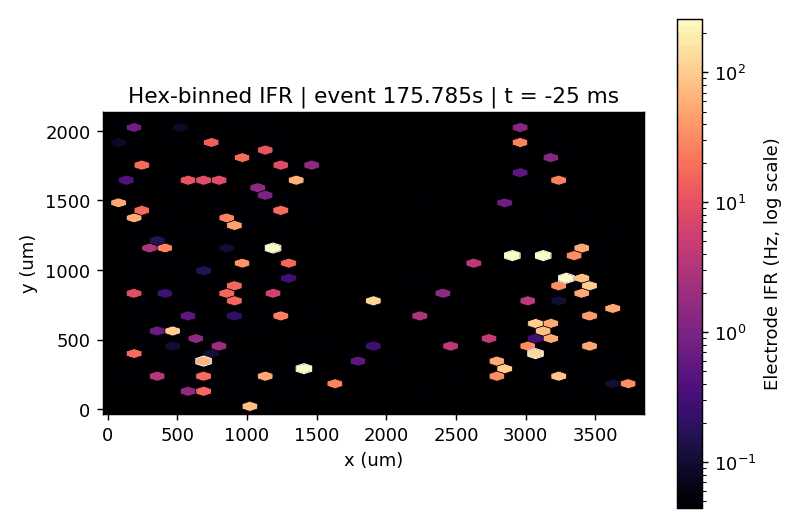

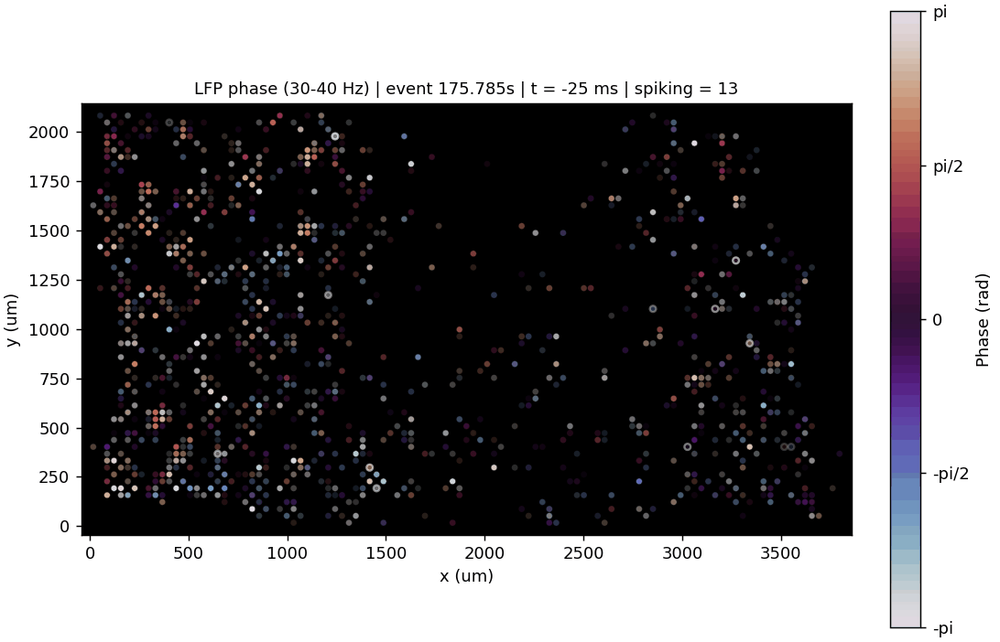

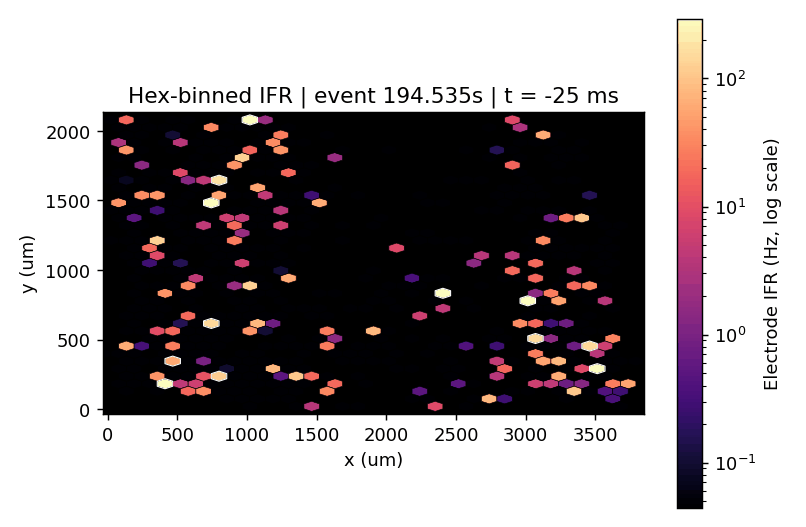

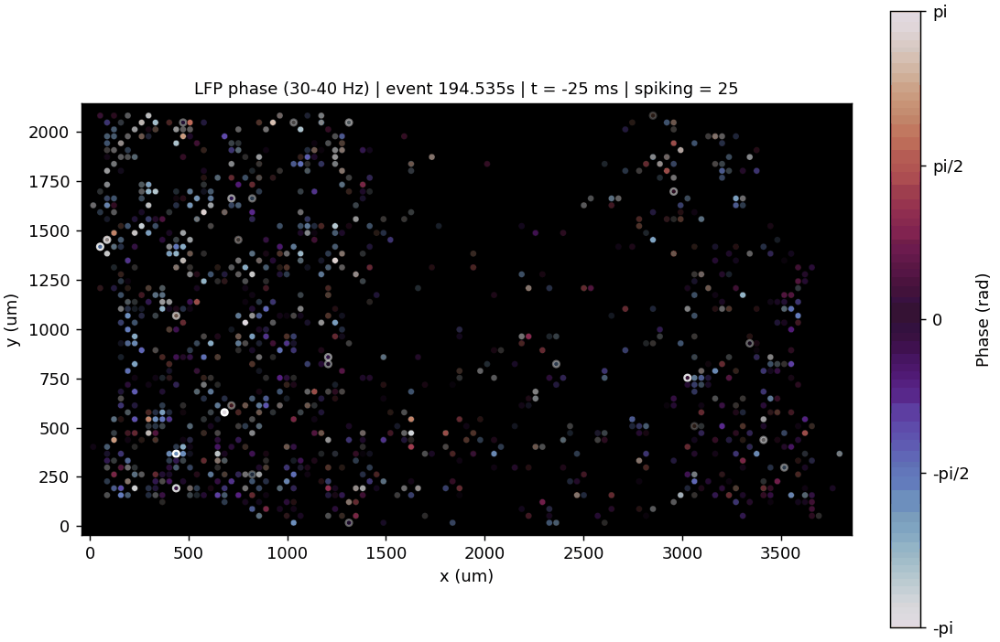

In [72]:
gif_paths = []
for i, anchor_time_s in enumerate(ANCHOR_TIMES_S):
    ifr_path, phase_path = render_event_gifs(anchor_time_s, tag=f"example{i}")
    gif_paths.append((ifr_path, phase_path))
    print(f"event {i} @ {anchor_time_s:.3f}s -> {ifr_path.name}, {phase_path.name}")

for ifr_path, phase_path in gif_paths:
    display(Image(filename=str(ifr_path)))
    display(Image(filename=str(phase_path)))